In [2]:
import numpy as np
import pandas as pd 
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import cv2
import random
# import pickle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import seaborn as sns
from collections import Counter
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras import callbacks
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from tensorflow.keras.models import Model
# from tensorflow.keras.optimizers import RMSprop
# from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, CSVLogger

from time import time
from datetime import datetime

In [32]:
TRAIN_DATADIR = '/Users/zahidulislam/Documents/Research/rmfrd/AFDB_face_dataset/'
TEST_DATADIR = '/Users/zahidulislam/Documents/Research/rmfrd/AFDB_masked_face_dataset/'
# DATADIR = r'C:\Users\HP\Documents\Zahid\cropped'
TEST_CATEGORIES = []
for folder in sorted(os.listdir(TEST_DATADIR)):
    if folder == ".DS_Store":
        continue
    TEST_CATEGORIES.append(folder)

In [33]:
TRAIN_DATADIR = '/Users/zahidulislam/Documents/Research/rmfrd/AFDB_face_dataset/'
TEST_DATADIR = '/Users/zahidulislam/Documents/Research/rmfrd/AFDB_masked_face_dataset/'
# DATADIR = r'C:\Users\HP\Documents\Zahid\cropped'
TRAIN_CATEGORIES = []
for folder in sorted(os.listdir(TRAIN_DATADIR)):
    if folder == ".DS_Store":
        continue
    TRAIN_CATEGORIES.append(folder)

In [34]:
print(len(TRAIN_CATEGORIES))
IMG_SIZE = 150

460


In [35]:
error_folder = []
for folder in TRAIN_CATEGORIES:
    if folder not in TEST_CATEGORIES:
        error_folder.append(folder)
        

In [36]:
error_folder = []
for folder in TEST_CATEGORIES:
    if folder not in TRAIN_CATEGORIES:
        error_folder.append(folder)

In [37]:
CATEGORIES = TEST_CATEGORIES

##  Training and testing data generator

In [38]:
training_data = []
testing_data = []
# flatten_training_data = []
# target_array = []

def create_training_data():
  for catagory in CATEGORIES:
    if catagory[0] == '.':
        continue

    train_path = os.path.join(TRAIN_DATADIR,catagory)
    test_path = os.path.join(TEST_DATADIR,catagory)
    class_num = CATEGORIES.index(catagory)
    
    for img in os.listdir(train_path):
        
        if img[0] == '.' :
            continue
#         print(img)
#         print(catagory, img)
        img_array = cv2.imread(os.path.join(train_path, img))
        new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
        
        training_data.append([new_array, class_num])

    for img in os.listdir(test_path):
        
        if img[0] == '.' :
            continue
#         print(img)
#         print(catagory, img)
        img_array = cv2.imread(os.path.join(test_path, img))
        new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
        
        testing_data.append([new_array, class_num])



            

            
     
             
            

t0 = time()
create_training_data()
print(f'Taken Time {time()-t0}')

# beep()

Taken Time 31.129698276519775


In [ ]:
# data_prep()
# def data_prep():
X_train = []
Y_train = []
for features, label in training_data:
  X_train.append(features)
  Y_train.append(label)

X_train = np.array(X_train).reshape(-1, IMG_SIZE, IMG_SIZE,3)

###################

X_test = []
Y_test = []
for features, label in testing_data:
  X_test.append(features)
  Y_test.append(label)

X_test = np.array(X_test).reshape(-1, IMG_SIZE, IMG_SIZE,3)

################


Y_train = np.array(Y_train)
Y_test = np.array(Y_test)

X_train = X_train/255.0
X_test = X_test/255.0

print(f'X_train.shape --> {X_train.shape}')
print(f'X_test.shape --> {X_test.shape}')
print(f'Y_train.shape --> {Y_train.shape}')
print(f'Y_test.shape --> {Y_test.shape}')

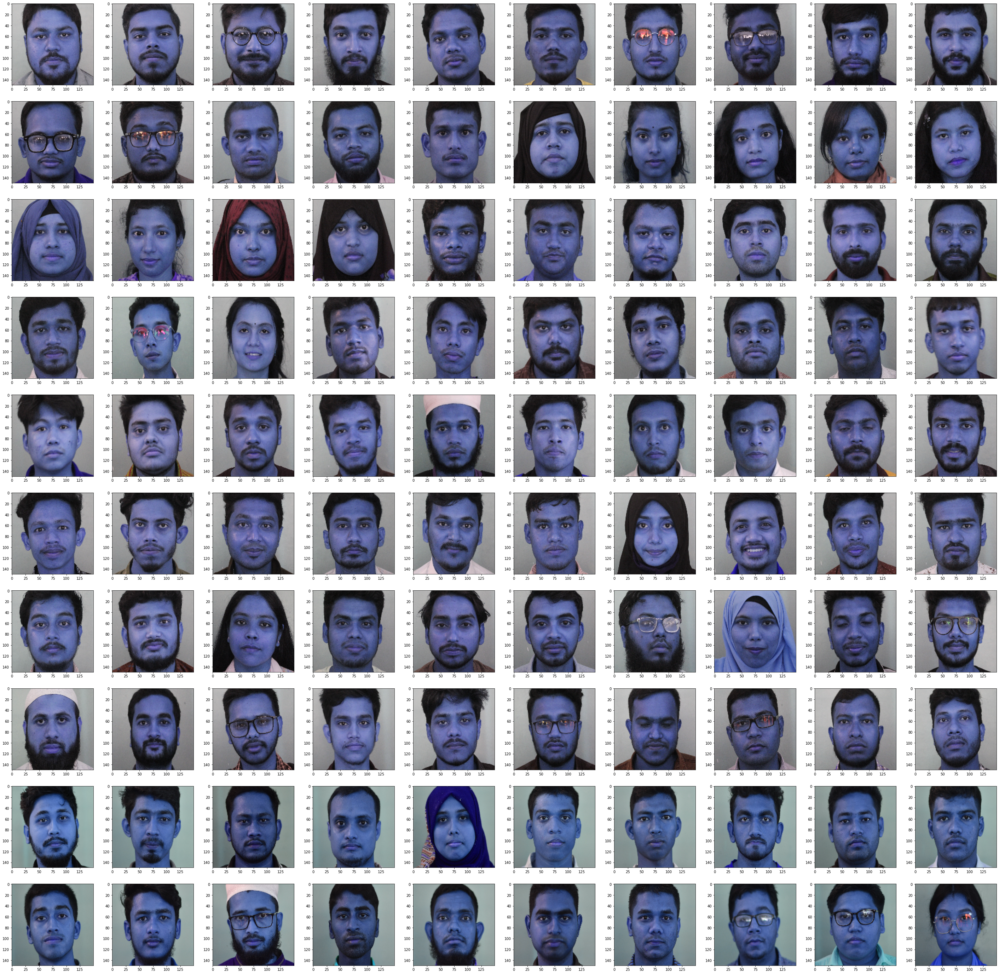

In [8]:
# for image in testing_data[:10][0]:
fig = plt.figure(figsize = (50,50))
rows = 10
cols = 10
for j in range(0, rows*cols):
    fig.add_subplot(rows, cols, j+1)
    plt.imshow(testing_data[j][0])

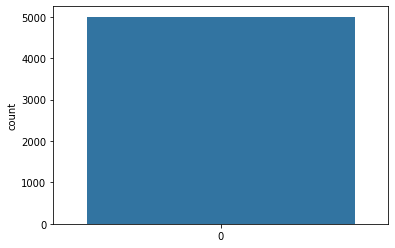

In [9]:
g = sns.countplot(Y_train)

In [10]:
print(f'X_train.shape --> {X_train.shape}')
print(f'X_test.shape --> {X_test.shape}')
print(f'Y_train.shape --> {Y_train.shape}')
print(f'Y_test.shape --> {Y_test.shape}')


X_train.shape --> (5003, 150, 150, 3)
X_test.shape --> (263, 150, 150, 3)
Y_train.shape --> (5003,)
Y_test.shape --> (263,)


In [11]:
earlystopping = callbacks.EarlyStopping(monitor ="val_accuracy", 
                                        mode ="max", patience = 5, 
                                        restore_best_weights = True)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)



In [12]:
def get_date_time():
    a = datetime.now()
    date_time_now = a.strftime("%d_%b__%H_%M") 
    return date_time_now

In [13]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score


def get_results(model):
    
    results = {
#     "train_loss":0,
    "test_loss":0,
#     "train_acc":0,
    "test_acc":0,
    "recall":0,
    "precision":0,
    "f1":0,
    
    }
    
    y_pred = model.predict(X_test)
    y_pred_bool = []

    for y in y_pred:
      y_pred_bool.append(np.argmax(y))
    
#     y_pred_bool = np.array(y_pred_bool)
#     print(type(Y_test), type(y_pred_bool))
#     print(Y_test, y_pred_bool)
    
    results["test_loss"], results["test_acc"]= model.evaluate(X_test, Y_test, verbose = 0) 
    
    results["precision"] = precision_score(Y_test, y_pred_bool, average = 'weighted')
    results["recall"] = recall_score (Y_test, y_pred_bool, average = 'weighted')
    results["f1"] = f1_score(Y_test, y_pred_bool, average = 'weighted')
    
    return results



In [14]:
def get_name(model, t, acc = False):
    
    model_save_path = r"C:\Users\HP\Documents\Zahid\Model"
    log_save_path = r"C:\Users\HP\Documents\Zahid\Logs"
    graph_save_path = r"C:\Users\HP\Documents\Zahid\Graphs"
    results_save_path = r"C:\Users\HP\Documents\Zahid\Results"
    
    
    if t=="graph":
        if acc:
            uni_name = os.path.join(graph_save_path, f"{model} RMFRD ACC {get_date_time()}.jpg")
        else:
            uni_name = os.path.join(graph_save_path, f"{model} RMFRD Face Loss {get_date_time()}.jpg")
            
    elif t=="model":
        uni_name = os.path.join(model_save_path, f"{model} RMFRD Face {get_date_time()}.h5")
    elif t=='log':
        uni_name = os.path.join(log_save_path, f"{model} RMFRD Face {get_date_time()}.log")
    elif t== 'results':
        uni_name = os.path.join(results_save_path, f"{model} RMFRD Face {get_date_time()}.csv")
    else:
        raise ValueError(f'You entered invalid value')
        
        
    return uni_name
    
    

In [15]:
get_name("cnn", "graph",)

'C:\\Users\\HP\\Documents\\Zahid\\Graphs\\cnn Open Face Loss 23_Jan__14_58.jpg'

# CNN

In [16]:

cnn_model = Sequential()



cnn_model.add(Conv2D(64, (3,3), activation = 'relu', input_shape = X_train.shape[1:]))
cnn_model.add(MaxPool2D(pool_size=(2,2)))

cnn_model.add(Conv2D(128, (3,3), activation = 'relu'))
# model.add(Dropout(.50))
cnn_model.add(MaxPool2D(pool_size=(2,2)))

cnn_model.add(Conv2D(256, (3,3), activation = 'relu'))
# model.add(Dropout(.50))
cnn_model.add(MaxPool2D(pool_size=(2,2)))

cnn_model.add(Conv2D(512, (3,3), activation = 'relu'))
# model.add(Dropout(.50))
cnn_model.add(MaxPool2D(pool_size=(2,2)))

cnn_model.add(Flatten())
cnn_model.add(Dense(4096, activation = 'relu'))
cnn_model.add(Dropout(.50))


cnn_model.add(Dense(len(CATEGORIES), activation = 'softmax'))



cnn_model.compile(loss = "SparseCategoricalCrossentropy", optimizer = "adam", metrics = ['accuracy'])
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 64)      1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 128)       73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 256)       295168    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 256)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 512)       1

In [17]:
batch_size = 128
name = get_name("CNN", "log")

csv_logger = CSVLogger(name)

history = cnn_model.fit(X_train,Y_train, batch_size=batch_size, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              
                              callbacks =[learning_rate_reduction,
                                          csv_logger
                                         ]
                              )
beep()

Epoch 1/50
40/40 - 22s - loss: 5.5923 - accuracy: 0.0018 - val_loss: 5.5753 - val_accuracy: 0.0038
Epoch 2/50
40/40 - 9s - loss: 5.5738 - accuracy: 0.0054 - val_loss: 5.5495 - val_accuracy: 0.0114
Epoch 3/50
40/40 - 9s - loss: 5.1775 - accuracy: 0.0214 - val_loss: 4.3086 - val_accuracy: 0.0989
Epoch 4/50
40/40 - 9s - loss: 4.1714 - accuracy: 0.1005 - val_loss: 3.1769 - val_accuracy: 0.2586
Epoch 5/50
40/40 - 9s - loss: 3.2299 - accuracy: 0.2257 - val_loss: 2.1211 - val_accuracy: 0.5019
Epoch 6/50
40/40 - 9s - loss: 2.3729 - accuracy: 0.3822 - val_loss: 1.3787 - val_accuracy: 0.6350
Epoch 7/50
40/40 - 9s - loss: 1.7219 - accuracy: 0.5261 - val_loss: 1.2040 - val_accuracy: 0.6616
Epoch 8/50
40/40 - 9s - loss: 1.1815 - accuracy: 0.6580 - val_loss: 0.7146 - val_accuracy: 0.7909
Epoch 9/50
40/40 - 9s - loss: 0.9285 - accuracy: 0.7310 - val_loss: 0.4861 - val_accuracy: 0.8783
Epoch 10/50
40/40 - 9s - loss: 0.5727 - accuracy: 0.8231 - val_loss: 0.3640 - val_accuracy: 0.8973
Epoch 11/50
40/40 

### CNN result save

In [18]:

cnn_results = get_results(cnn_model)
cnn_results

C:\Users\HP\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'test_loss': 0.14272364974021912,
 'test_acc': 0.9733840227127075,
 'recall': 0.973384030418251,
 'precision': 0.9600760456273765,
 'f1': 0.964512040557668}

### CNN Model save

In [19]:
name = get_name("CNN", "model")
cnn_model.save(name)

### CNN Graph save

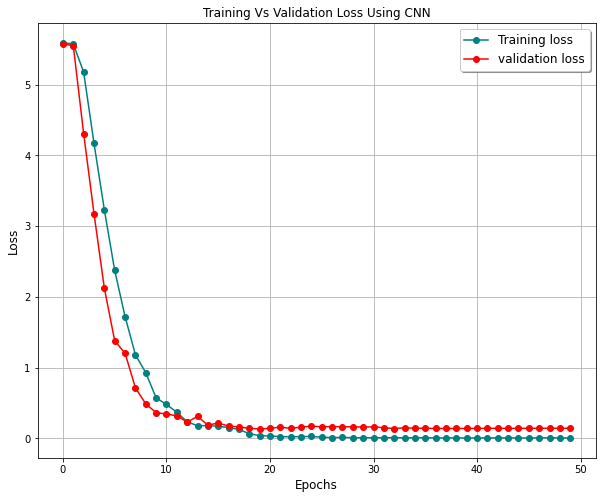

In [20]:

plt.figure(figsize=(10,8))
plt.plot(history.history['loss'], color='teal', label="Training loss", marker='o')
plt.plot(history.history['val_loss'], color='red', label="validation loss", marker='o')

legend = plt.legend(loc='best', shadow=True, fontsize=12)

plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Loss', fontsize=12, color = 'black')

plt.title("Training Vs Validation Loss Using CNN",fontsize=12, color = 'black' )
plt.grid()

name = get_name("CNN", "graph")
plt.savefig(name, dpi = 300)

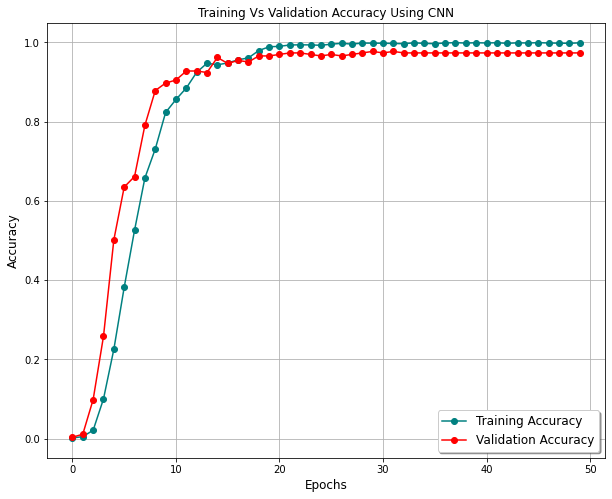

In [21]:

plt.figure(figsize=(10,8))
plt.plot(history.history['accuracy'], color='teal', label="Training Accuracy", marker='o')
plt.plot(history.history['val_accuracy'], color='red', label="Validation Accuracy", marker='o')
legend = plt.legend(loc='best', shadow=True,fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Accuracy',fontsize=12, color = 'black')
plt.title("Training Vs Validation Accuracy Using CNN" ,fontsize=12, color = 'black')
plt.grid()

name = get_name("CNN", "graph", acc = True)
plt.savefig(name, dpi = 300)

In [22]:
# fig, ax = plt.subplots(2,1)
# ax[0].plot(history.history['loss'], color='b', label="Training loss")
# ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
# legend = ax[0].legend(loc='best', shadow=True)

# ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
# ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
# legend = ax[1].legend(loc='best', shadow=True)

# Transfer Learning

## VGG19 Pure

In [23]:
from tensorflow.keras.applications.vgg19 import VGG19

import tensorflow

In [24]:
vgg19 = VGG19(input_shape = X_train.shape[1:], weights = 'imagenet', include_top = False)

In [25]:
for layer in vgg19.layers:
    layer.trainable = False
    

num_classes = len(CATEGORIES)

x = Flatten()(vgg19.output)

predictions = Dense(num_classes, activation = 'softmax')(x)


vgg19_model = Model(inputs = vgg19.input, outputs = predictions)


vgg19_model.compile(optimizer='adam', loss='SparseCategoricalCrossentropy', metrics=['accuracy'])

In [26]:
uni_name = f"VGG19 Open Face {get_date_time()}"

In [27]:
name =get_name("VGG19", "log")
csv_logger = CSVLogger(name)
history = vgg19_model.fit(X_train,Y_train, batch_size=128, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              callbacks =[learning_rate_reduction,
                                          csv_logger
                                         ]
                              )
beep()

Epoch 1/50
40/40 - 20s - loss: 5.4566 - accuracy: 0.0698 - val_loss: 3.9074 - val_accuracy: 0.2662
Epoch 2/50
40/40 - 10s - loss: 2.8753 - accuracy: 0.4851 - val_loss: 2.7169 - val_accuracy: 0.4943
Epoch 3/50
40/40 - 10s - loss: 1.6189 - accuracy: 0.7837 - val_loss: 2.0269 - val_accuracy: 0.6844
Epoch 4/50
40/40 - 10s - loss: 0.9325 - accuracy: 0.9192 - val_loss: 1.5979 - val_accuracy: 0.7605
Epoch 5/50
40/40 - 10s - loss: 0.5645 - accuracy: 0.9752 - val_loss: 1.3787 - val_accuracy: 0.7643
Epoch 6/50
40/40 - 10s - loss: 0.3633 - accuracy: 0.9918 - val_loss: 1.2305 - val_accuracy: 0.8137
Epoch 7/50
40/40 - 10s - loss: 0.2435 - accuracy: 0.9964 - val_loss: 1.0919 - val_accuracy: 0.8441
Epoch 8/50
40/40 - 10s - loss: 0.1675 - accuracy: 0.9994 - val_loss: 0.9801 - val_accuracy: 0.8745
Epoch 9/50
40/40 - 10s - loss: 0.1262 - accuracy: 0.9998 - val_loss: 0.9040 - val_accuracy: 0.9049
Epoch 10/50
40/40 - 10s - loss: 0.0978 - accuracy: 0.9998 - val_loss: 0.8584 - val_accuracy: 0.9011
Epoch 11/

In [28]:
name =get_name("VGG19", "model")
vgg19_model.save(name)

In [29]:

vgg19_results = get_results(vgg19_model)
vgg19_results

C:\Users\HP\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'test_loss': 0.6720800399780273,
 'test_acc': 0.9087452292442322,
 'recall': 0.908745247148289,
 'precision': 0.8723067173637515,
 'f1': 0.8830164765525983}

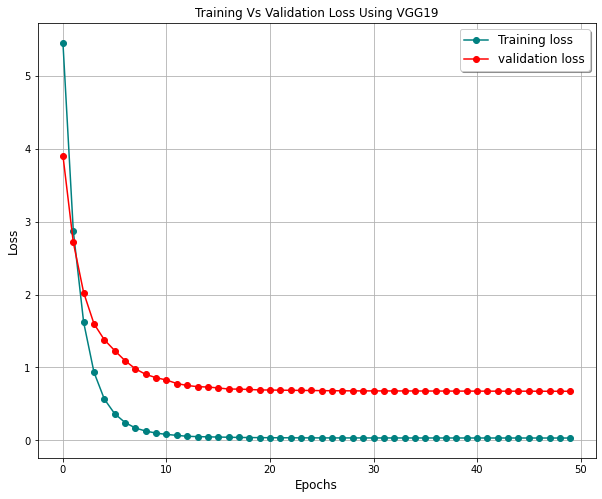

In [30]:

plt.figure(figsize=(10,8))
plt.plot(history.history['loss'], color='teal', label="Training loss", marker='o')
plt.plot(history.history['val_loss'], color='red', label="validation loss", marker='o')
legend = plt.legend(loc='best', shadow=True, fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Loss', fontsize=12, color = 'black')
plt.title("Training Vs Validation Loss Using VGG19",fontsize=12, color = 'black' )
plt.grid()


name = get_name("VGG19", "graph")
plt.savefig(name, dpi = 300)

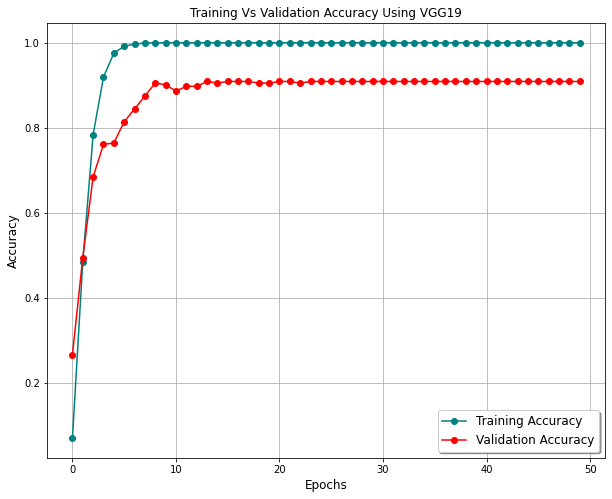

In [31]:
plt.figure(figsize=(10,8))
plt.plot(history.history['accuracy'], color='teal', label="Training Accuracy", marker='o')
plt.plot(history.history['val_accuracy'], color='red', label="Validation Accuracy", marker='o')
legend = plt.legend(loc='best', shadow=True,fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Accuracy',fontsize=12, color = 'black')
plt.title("Training Vs Validation Accuracy Using VGG19" ,fontsize=12, color = 'black')
plt.grid()


name = get_name("VGG19", "graph", acc = True)
plt.savefig(name, dpi = 300)

In [32]:
# vgg19_model.save("vgg19_customized_96.h5")

## VGG19 Modified

In [15]:
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.models import Model

In [16]:
ex_vgg19 = VGG19(input_shape = X_train.shape[1:], weights = 'imagenet', include_top = False)

In [17]:
for layer in ex_vgg19.layers:
    layer.trainable = False
    

num_classes = len(CATEGORIES)

x = Flatten()(ex_vgg19.output)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
predictions = Dense(num_classes, activation = 'softmax')(x)


ex_vgg19_model = Model(inputs = ex_vgg19.input, outputs = predictions)


ex_vgg19_model.compile(optimizer='adam', loss='SparseCategoricalCrossentropy', metrics=['accuracy'])




# vgg19_model = Model(inputs = vgg19.input, outputs = prediction)

In [18]:
# vgg19_model.summary()


In [19]:
name = get_name("EX_VGG19", "log")
csv_logger = CSVLogger(name)
history = ex_vgg19_model.fit(X_train,Y_train, batch_size=128, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              
                              callbacks =[learning_rate_reduction,  csv_logger]
                              )
beep()

Epoch 1/50
40/40 - 23s - loss: 5.3621 - accuracy: 0.0506 - val_loss: 4.5662 - val_accuracy: 0.1331
Epoch 2/50
40/40 - 10s - loss: 3.6956 - accuracy: 0.2568 - val_loss: 3.4307 - val_accuracy: 0.3878
Epoch 3/50
40/40 - 10s - loss: 2.6590 - accuracy: 0.5117 - val_loss: 2.9718 - val_accuracy: 0.4639
Epoch 4/50
40/40 - 10s - loss: 1.8693 - accuracy: 0.7070 - val_loss: 2.7927 - val_accuracy: 0.4297
Epoch 5/50
40/40 - 10s - loss: 1.3051 - accuracy: 0.8451 - val_loss: 2.3151 - val_accuracy: 0.5665
Epoch 6/50
40/40 - 11s - loss: 0.9527 - accuracy: 0.9097 - val_loss: 1.9554 - val_accuracy: 0.6920
Epoch 7/50
40/40 - 11s - loss: 0.6963 - accuracy: 0.9450 - val_loss: 1.6897 - val_accuracy: 0.7909
Epoch 8/50
40/40 - 10s - loss: 0.5493 - accuracy: 0.9600 - val_loss: 1.4289 - val_accuracy: 0.8251
Epoch 9/50
40/40 - 11s - loss: 0.4434 - accuracy: 0.9706 - val_loss: 1.3443 - val_accuracy: 0.8631
Epoch 10/50
40/40 - 10s - loss: 0.3365 - accuracy: 0.9812 - val_loss: 1.0734 - val_accuracy: 0.8973
Epoch 11/

In [20]:
name = get_name("EX_VGG19", "model")
ex_vgg19_model.save(name)

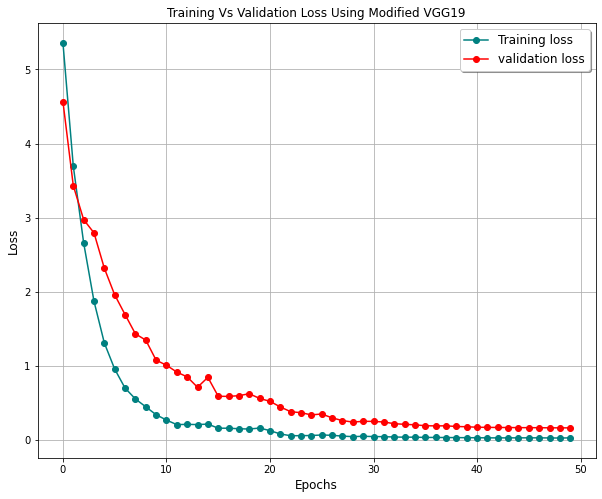

In [21]:

plt.figure(figsize=(10,8))
plt.plot(history.history['loss'], color='teal', label="Training loss", marker='o')
plt.plot(history.history['val_loss'], color='red', label="validation loss", marker='o')
legend = plt.legend(loc='best', shadow=True, fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Loss', fontsize=12, color = 'black')
plt.title("Training Vs Validation Loss Using Extended VGG19",fontsize=12, color = 'black' )
plt.grid()


name = get_name("EX_VGG19", "graph")
plt.savefig(name, dpi = 300)

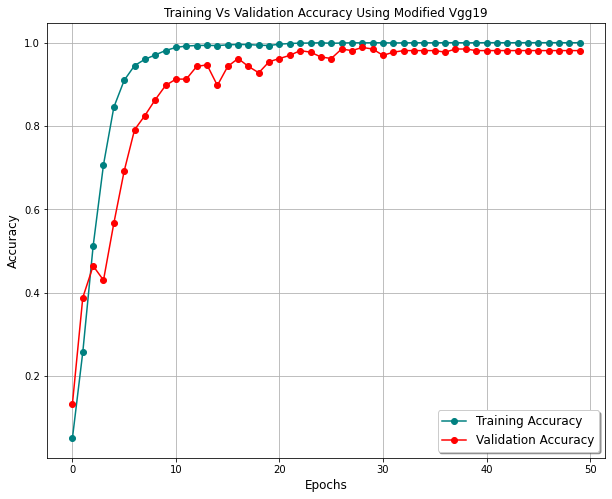

In [22]:

plt.figure(figsize=(10,8))
plt.plot(history.history['accuracy'], color='teal', label="Training Accuracy", marker='o')
plt.plot(history.history['val_accuracy'], color='red', label="Validation Accuracy", marker='o')
legend = plt.legend(loc='best', shadow=True,fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Accuracy',fontsize=12, color = 'black')
plt.title("Training Vs Validation Accuracy Using Extended Vgg19",fontsize=12, color = 'black')
plt.grid()


name = get_name("EX_VGG19", "graph", acc = True)
plt.savefig(name, dpi = 300)

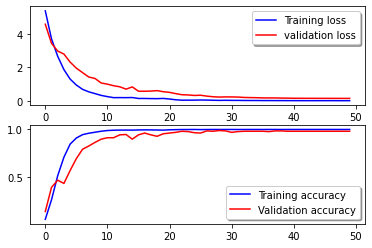

In [23]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [24]:

Ex_vgg19_results = get_results(ex_vgg19_model)
Ex_vgg19_results

C:\Users\HP\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'test_loss': 0.15860112011432648,
 'test_acc': 0.980988621711731,
 'recall': 0.9809885931558935,
 'precision': 0.9714828897338403,
 'f1': 0.9746514575411913}

## Resnet

In [39]:
from tensorflow.keras.applications.resnet50 import ResNet50
resnet50 = ResNet50(input_shape = X_train.shape[1:], weights = 'imagenet', include_top = False)


for layer in resnet50.layers:
    layer.trainable = False

x = Flatten()(resnet50.output)
prediction = Dense(len(CATEGORIES), activation = 'softmax')(x)
resnet50_model = Model(inputs = resnet50.input, outputs = prediction)

In [40]:
resnet50_model.summary()


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 156, 156, 3)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 75, 75, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 75, 75, 64)   256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [41]:
resnet50_model.compile(loss = "SparseCategoricalCrossentropy", optimizer = "adam", metrics = ['accuracy'])

In [42]:
history = resnet50_model.fit(X_train,Y_train, batch_size=128, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              
#                               callbacks =[learning_rate_reduction, earlystopping]
                              )

Epoch 1/50
40/40 - 13s - loss: 7.2723 - accuracy: 0.0052 - val_loss: 6.1570 - val_accuracy: 0.0114
Epoch 2/50
40/40 - 7s - loss: 6.1088 - accuracy: 0.0212 - val_loss: 5.8787 - val_accuracy: 0.0190
Epoch 3/50
40/40 - 7s - loss: 5.8517 - accuracy: 0.0346 - val_loss: 5.5964 - val_accuracy: 0.0342
Epoch 4/50
40/40 - 7s - loss: 5.6144 - accuracy: 0.0550 - val_loss: 5.5821 - val_accuracy: 0.0456
Epoch 5/50
40/40 - 7s - loss: 5.4508 - accuracy: 0.0710 - val_loss: 5.3245 - val_accuracy: 0.0380
Epoch 6/50
40/40 - 7s - loss: 5.1992 - accuracy: 0.0961 - val_loss: 5.0979 - val_accuracy: 0.0570
Epoch 7/50
40/40 - 7s - loss: 5.0394 - accuracy: 0.1095 - val_loss: 5.3232 - val_accuracy: 0.0494
Epoch 8/50
40/40 - 7s - loss: 4.9622 - accuracy: 0.1259 - val_loss: 5.0588 - val_accuracy: 0.0418
Epoch 9/50
40/40 - 7s - loss: 4.7263 - accuracy: 0.1489 - val_loss: 4.9118 - val_accuracy: 0.0875
Epoch 10/50
40/40 - 7s - loss: 4.6793 - accuracy: 0.1635 - val_loss: 4.5766 - val_accuracy: 0.0722
Epoch 11/50
40/40 

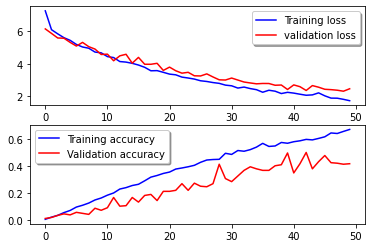

In [43]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

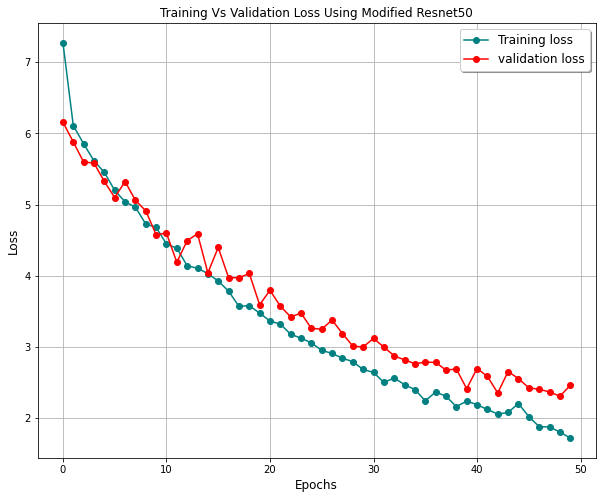

In [44]:

plt.figure(figsize=(10,8))
plt.plot(history.history['loss'], color='teal', label="Training loss", marker='o')
plt.plot(history.history['val_loss'], color='red', label="validation loss", marker='o')
legend = plt.legend(loc='best', shadow=True, fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Loss', fontsize=12, color = 'black')
plt.title("Training Vs Validation Loss Using Resnet50",fontsize=12, color = 'black' )
plt.grid()


name = get_name("resnet50", "graph")
plt.savefig(name, dpi = 300)

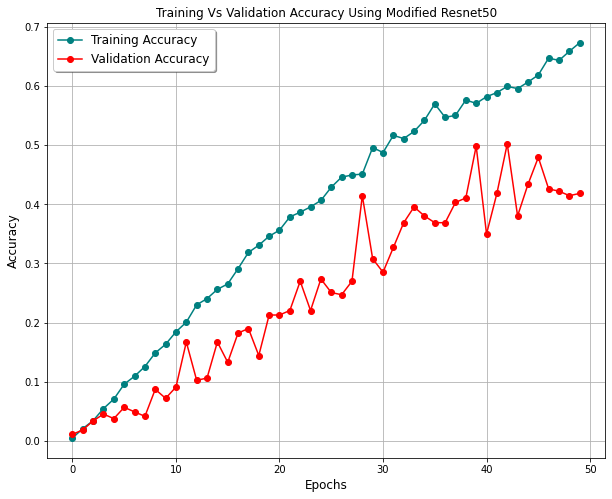

In [45]:

plt.figure(figsize=(10,8))
plt.plot(history.history['accuracy'], color='teal', label="Training Accuracy", marker='o')
plt.plot(history.history['val_accuracy'], color='red', label="Validation Accuracy", marker='o')
legend = plt.legend(loc='best', shadow=True,fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Accuracy',fontsize=12, color = 'black')
plt.title("Training Vs Validation Accuracy Using Resnet50",fontsize=12, color = 'black')
plt.grid()


name = get_name("resnet50", "graph", acc = True)
plt.savefig(name, dpi = 300)

In [46]:
name = get_name("resnet50", "model")
resnet50_model.save(name)

C:\Users\HP\anaconda3\envs\tf-gpu\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


In [ ]:
resnet_results = get_results(resnet50_model)
resnet_results

## Inception V3

In [23]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

In [24]:
inceptionv3 = InceptionV3(input_shape = X_train.shape[1:], weights = 'imagenet', include_top = False)

In [25]:
for layer in inceptionv3.layers:
    layer.trainable = False

x = Flatten()(inceptionv3.output)
prediction = Dense(len(CATEGORIES), activation = 'softmax')(x)
inceptionv3_model = Model(inputs = inceptionv3.input, outputs = prediction)

NameError: name 'Model' is not defined

In [35]:
inceptionv3_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 32)   864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 74, 74, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 74, 74, 32)   0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

In [36]:
inceptionv3_model.compile(loss = "SparseCategoricalCrossentropy", optimizer = "adam", metrics = ['accuracy'])

In [37]:
history = inceptionv3_model.fit(X_train,Y_train, batch_size=128, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              
#                               callbacks =[learning_rate_reduction, earlystopping]
                              )

Epoch 1/50
157/157 - 15s - loss: 33.0132 - accuracy: 0.0630 - val_loss: 15.5765 - val_accuracy: 0.1635
Epoch 2/50
157/157 - 7s - loss: 12.8613 - accuracy: 0.3668 - val_loss: 12.7017 - val_accuracy: 0.2890
Epoch 3/50
157/157 - 7s - loss: 7.5726 - accuracy: 0.5623 - val_loss: 8.8820 - val_accuracy: 0.3612
Epoch 4/50
157/157 - 7s - loss: 4.5768 - accuracy: 0.6900 - val_loss: 11.2878 - val_accuracy: 0.3156
Epoch 5/50
157/157 - 7s - loss: 3.6788 - accuracy: 0.7551 - val_loss: 9.1318 - val_accuracy: 0.4297
Epoch 6/50
157/157 - 7s - loss: 3.2469 - accuracy: 0.7887 - val_loss: 10.6431 - val_accuracy: 0.3992
Epoch 7/50
157/157 - 7s - loss: 2.9339 - accuracy: 0.8183 - val_loss: 13.5711 - val_accuracy: 0.3460
Epoch 8/50
157/157 - 7s - loss: 2.8156 - accuracy: 0.8329 - val_loss: 9.2407 - val_accuracy: 0.5095
Epoch 9/50
157/157 - 7s - loss: 2.0580 - accuracy: 0.8593 - val_loss: 10.9107 - val_accuracy: 0.4297
Epoch 10/50
157/157 - 7s - loss: 2.0468 - accuracy: 0.8701 - val_loss: 12.0069 - val_accura

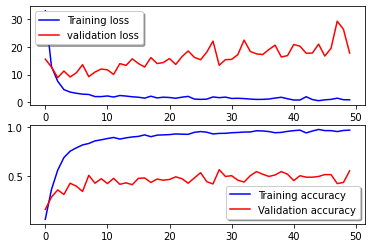

In [38]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [ ]:
inceptionv3_results = get_results(inceptionv3_model)
inceptionv3_results

## MobileNet

In [49]:
from tensorflow.keras.applications.mobilenet import MobileNet
mobilenet = MobileNet(input_shape = X_train.shape[1:], weights = 'imagenet', include_top = False)

In [50]:
for layer in mobilenet.layers:
    layer.trainable = False

x = Flatten()(mobilenet.output)
prediction = Dense(len(CATEGORIES), activation = 'softmax')(x)
mobilenet_model = Model(inputs = mobilenet.input, outputs = prediction)

In [51]:
mobilenet_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 75, 75, 32)        864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 75, 75, 32)        128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 75, 75, 32)        0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 75, 75, 32)        288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 75, 75, 32)        128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 75, 75, 32)        0   

In [52]:
mobilenet_model.compile(loss = "SparseCategoricalCrossentropy", optimizer = "adam", metrics = ['accuracy'])

In [ ]:
history = mobilenet_model.fit(X_train,Y_train, batch_size=128, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              
#                               callbacks =[learning_rate_reduction, earlystopping]
                              )

Epoch 1/50
40/40 - 6s - loss: 13.4962 - accuracy: 0.1383 - val_loss: 6.1127 - val_accuracy: 0.3650
Epoch 2/50
40/40 - 3s - loss: 1.2979 - accuracy: 0.8017 - val_loss: 1.8827 - val_accuracy: 0.6046
Epoch 3/50
40/40 - 3s - loss: 0.2009 - accuracy: 0.9564 - val_loss: 1.5531 - val_accuracy: 0.7034
Epoch 4/50
40/40 - 3s - loss: 0.0801 - accuracy: 0.9834 - val_loss: 1.3091 - val_accuracy: 0.7262
Epoch 5/50
40/40 - 3s - loss: 0.0565 - accuracy: 0.9884 - val_loss: 1.3727 - val_accuracy: 0.7034
Epoch 6/50
40/40 - 3s - loss: 0.0385 - accuracy: 0.9916 - val_loss: 1.4072 - val_accuracy: 0.7338
Epoch 7/50
40/40 - 3s - loss: 0.0375 - accuracy: 0.9910 - val_loss: 1.1933 - val_accuracy: 0.7490
Epoch 8/50
40/40 - 3s - loss: 0.0572 - accuracy: 0.9876 - val_loss: 1.2541 - val_accuracy: 0.7414
Epoch 9/50
40/40 - 3s - loss: 0.0557 - accuracy: 0.9874 - val_loss: 1.3505 - val_accuracy: 0.7148
Epoch 10/50
40/40 - 3s - loss: 0.3441 - accuracy: 0.9552 - val_loss: 1.7817 - val_accuracy: 0.6920
Epoch 11/50
40/40 

In [ ]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [ ]:

plt.figure(figsize=(10,8))
plt.plot(history.history['loss'], color='teal', label="Training loss", marker='o')
plt.plot(history.history['val_loss'], color='red', label="validation loss", marker='o')
legend = plt.legend(loc='best', shadow=True, fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Loss', fontsize=12, color = 'black')
plt.title("Training Vs Validation Loss Using Mobilenet",fontsize=12, color = 'black' )
plt.grid()


name = get_name("mobilenet", "graph")
plt.savefig(name, dpi = 300)

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(history.history['accuracy'], color='teal', label="Training Accuracy", marker='o')
plt.plot(history.history['val_accuracy'], color='red', label="Validation Accuracy", marker='o')
legend = plt.legend(loc='best', shadow=True,fontsize=12)
plt.xlabel('Epochs',fontsize=12, color = 'black')
plt.ylabel('Accuracy',fontsize=12, color = 'black')
plt.title("Training Vs Validation Accuracy Using Mobilenet",fontsize=12, color = 'black')
plt.grid()


name = get_name("mobilenet", "graph", acc = True)
plt.savefig(name, dpi = 300)

In [ ]:
mobilenet_results = get_rsults(mobilenet_model)
mobilenet_results

In [ ]:
name = get_name("mobilenet", "model")
mobilenet_model.save(name)

## EfficientNet B7

In [46]:
from tensorflow.keras.applications import EfficientNetB7

In [47]:
enetb7 = EfficientNetB7(input_shape = X_train.shape[1:], weights = 'imagenet', include_top = False)

A local file was found, but it seems to be incomplete or outdated because the auto file hash does not match the original value of cbcfe4450ddf6f3ad90b1b398090fe4a so we will re-download the data.
258088960/258076736 [==============================] - 266s 1us/step


In [48]:
for layer in enetb7.layers:
    layer.trainable = False

x = Flatten()(enetb7.output)
prediction = Dense(len(CATEGORIES), activation = 'softmax')(x)
enetb7_model = Model(inputs = enetb7.input, outputs = prediction)

In [49]:
enetb7_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 150, 150, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 150, 150, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 151, 151, 3)  0           normalization[0][0]              
____________________________________________________________________________________________

block7d_expand_bn (BatchNormali (None, 5, 5, 3840)   15360       block7d_expand_conv[0][0]        
__________________________________________________________________________________________________
block7d_expand_activation (Acti (None, 5, 5, 3840)   0           block7d_expand_bn[0][0]          
__________________________________________________________________________________________________
block7d_dwconv (DepthwiseConv2D (None, 5, 5, 3840)   34560       block7d_expand_activation[0][0]  
__________________________________________________________________________________________________
block7d_bn (BatchNormalization) (None, 5, 5, 3840)   15360       block7d_dwconv[0][0]             
__________________________________________________________________________________________________
block7d_activation (Activation) (None, 5, 5, 3840)   0           block7d_bn[0][0]                 
__________________________________________________________________________________________________
block7d_se

In [50]:
enetb7_model.compile(loss = "SparseCategoricalCrossentropy", optimizer = "adam", metrics = ['accuracy'])

In [ ]:
history = enetb7_model.fit(X_train,Y_train, batch_size=16, epochs = 50, 
                              validation_data = (X_test,Y_test),
                              verbose = 2, 
                              
#                               callbacks =[learning_rate_reduction, earlystopping]
                              )

Epoch 1/50
313/313 - 73s - loss: 323.8843 - accuracy: 0.0044 - val_loss: 175.2491 - val_accuracy: 0.0038
Epoch 2/50
313/313 - 49s - loss: 178.2669 - accuracy: 0.0030 - val_loss: 194.4808 - val_accuracy: 0.0038
Epoch 3/50
313/313 - 49s - loss: 185.2473 - accuracy: 0.0018 - val_loss: 194.9287 - val_accuracy: 0.0038
Epoch 4/50
313/313 - 49s - loss: 194.1985 - accuracy: 0.0030 - val_loss: 210.7475 - val_accuracy: 0.0038
Epoch 5/50
313/313 - 48s - loss: 198.4130 - accuracy: 0.0050 - val_loss: 208.2645 - val_accuracy: 0.0038
Epoch 6/50
313/313 - 48s - loss: 191.8870 - accuracy: 0.0048 - val_loss: 199.5615 - val_accuracy: 0.0038
Epoch 7/50
313/313 - 48s - loss: 189.6261 - accuracy: 0.0026 - val_loss: 197.9664 - val_accuracy: 0.0038
Epoch 8/50
313/313 - 47s - loss: 198.8195 - accuracy: 0.0026 - val_loss: 186.8689 - val_accuracy: 0.0038
Epoch 9/50
313/313 - 47s - loss: 190.0100 - accuracy: 0.0042 - val_loss: 195.3302 - val_accuracy: 0.0038
Epoch 10/50
313/313 - 47s - loss: 203.4015 - accuracy: 

## Previous Model